In [1]:
import torch
from unidepth.models import UniDepthV1
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

In [2]:
# Load the UniDepth model
model = UniDepthV1.from_pretrained("lpiccinelli/unidepth-v1-vitl14")

# model = UniDepthV1.from_pretrained("lpiccinelli/unidepth-v2-vitl14")


In [3]:
print(torch.cuda.is_available()) 

True


In [4]:
# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = model.to(device)

cuda


In [5]:
# Load the RGB image and move to the GPU
rgb = torch.from_numpy(np.array(Image.open("assets/demo/TimeVideo_20240901_180247_30feet_frame_0000.jpeg"))).permute(2, 0, 1)  # C, H, W
rgb = rgb.to(device)  # Move to GPU
intrinsics_torch = torch.from_numpy(np.load("assets/demo/camera_matrix.npy"))

In [6]:
print(intrinsics_torch)

tensor([[1.4713e+03, 0.0000e+00, 9.6052e+02],
        [0.0000e+00, 1.4755e+03, 5.2008e+02],
        [0.0000e+00, 0.0000e+00, 1.0000e+00]], dtype=torch.float64)


In [7]:
# Convert the intrinsics matrix to float32
intrinsics_torch = intrinsics_torch.float()
intrinsics_torch

tensor([[1.4713e+03, 0.0000e+00, 9.6052e+02],
        [0.0000e+00, 1.4755e+03, 5.2008e+02],
        [0.0000e+00, 0.0000e+00, 1.0000e+00]])

In [8]:
# Perform inference
predictions = model.infer(rgb, intrinsics_torch)

In [9]:
# Metric Depth Estimation
depth = predictions["depth"]

# Point Cloud in Camera Coordinate
xyz = predictions["points"]

# Intrinsics Prediction
intrinsics = predictions["intrinsics"]

In [10]:
print(depth)

tensor([[[[8.8612, 8.8612, 8.9036,  ..., 7.5559, 7.5314, 7.5314],
          [8.8612, 8.8612, 8.9036,  ..., 7.5559, 7.5314, 7.5314],
          [8.8620, 8.8620, 8.9038,  ..., 7.5808, 7.5564, 7.5564],
          ...,
          [2.4276, 2.4276, 2.4988,  ..., 1.7275, 1.7308, 1.7308],
          [2.4180, 2.4180, 2.4889,  ..., 1.7266, 1.7300, 1.7300],
          [2.4180, 2.4180, 2.4889,  ..., 1.7266, 1.7300, 1.7300]]]],
       device='cuda:0')


In [11]:
print(xyz)

tensor([[[[-5.7756, -5.7568, -5.7654,  ..., 25.7605, 25.6928, 25.7088],
          [-5.7756, -5.7568, -5.7654,  ..., 25.7605, 25.6928, 25.7088],
          [-5.7761, -5.7573, -5.7656,  ..., 25.8452, 25.7781, 25.7941],
          ...,
          [-1.5823, -1.5771, -1.6181,  ...,  5.8897,  5.9046,  5.9082],
          [-1.5760, -1.5709, -1.6117,  ...,  5.8866,  5.9016,  5.9053],
          [-1.5760, -1.5709, -1.6117,  ...,  5.8866,  5.9016,  5.9053]],

         [[-4.1997, -4.1997, -4.2197,  ..., -3.5811, -3.5694, -3.5694],
          [-4.1810, -4.1810, -4.2009,  ..., -3.5651, -3.5535, -3.5535],
          [-4.1626, -4.1626, -4.1823,  ..., -3.5608, -3.5494, -3.5494],
          ...,
          [ 4.3725,  4.3725,  4.5007,  ...,  3.1115,  3.1174,  3.1174],
          [ 4.3602,  4.3602,  4.4880,  ...,  3.1136,  3.1195,  3.1195],
          [ 4.3653,  4.3653,  4.4933,  ...,  3.1172,  3.1232,  3.1232]],

         [[ 8.8612,  8.8612,  8.9036,  ...,  7.5559,  7.5314,  7.5314],
          [ 8.8612,  8.8612,  

In [12]:
print(intrinsics)

tensor([[[1.9006e+03, 0.0000e+00, 9.5768e+02],
         [0.0000e+00, 1.9433e+03, 5.3778e+02],
         [0.0000e+00, 0.0000e+00, 1.0000e+00]]], device='cuda:0')


In [13]:
print("Available predictions:", list(predictions.keys()))

Available predictions: ['intrinsics', 'points', 'depth']


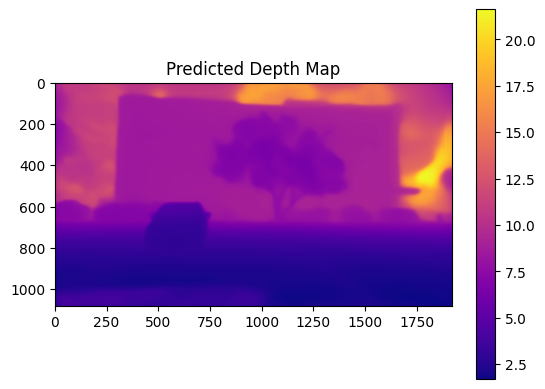

In [14]:
# Squeeze to remove unnecessary dimensions and move to CPU
depth_map = depth.squeeze().cpu().numpy()

# Visualize the depth map
plt.imshow(depth_map, cmap='plasma')
plt.colorbar()
plt.title('Predicted Depth Map')
plt.show()


## Load car's pixels positions

In [15]:
# Load the car pixel positions from the file
def load_pixel_positions(filepath):
    pixel_positions = []
    with open(filepath, 'r') as file:
        for line in file:
        # Skip the header line
            if line.startswith("#"):
                continue
            x, y = map(int, line.strip().split())
            pixel_positions.append((x, y))
    return pixel_positions


In [16]:
# Extract depth values at specific pixel positions
def extract_depth_values(depth, pixel_positions):
    depth_values = []
    for x, y in pixel_positions:
        depth_values.append(depth[0, 0, y, x].item())  # Assuming depth shape is [1, 1, H, W]
    return depth_values


In [17]:
# Path to your pixel positions file
pixel_positions_filepath = "./assets/demo/car_pixel_positions_test_car_w_timestamp.txt"
pixel_positions = load_pixel_positions(pixel_positions_filepath)

# Extract depth values at the specified pixel positions
depth_values = extract_depth_values(depth, pixel_positions)

# Print the depth values for the specific pixel positions
for idx, depth_value in enumerate(depth_values):
    print(f"Pixel {pixel_positions[idx]}: Depth = {depth_value}")


Pixel (575, 660): Depth = 3.5485942363739014
Pixel (575, 661): Depth = 3.53397798538208
Pixel (575, 662): Depth = 3.519361972808838
Pixel (575, 663): Depth = 3.504896640777588
Pixel (575, 664): Depth = 3.491016149520874
Pixel (575, 665): Depth = 3.4771358966827393
Pixel (575, 666): Depth = 3.4633283615112305
Pixel (575, 667): Depth = 3.4503207206726074
Pixel (575, 668): Depth = 3.4373128414154053
Pixel (575, 669): Depth = 3.424304962158203
Pixel (575, 670): Depth = 3.4121034145355225
Pixel (575, 671): Depth = 3.399933338165283
Pixel (575, 672): Depth = 3.387763261795044
Pixel (575, 673): Depth = 3.3758041858673096
Pixel (575, 674): Depth = 3.3638851642608643
Pixel (575, 675): Depth = 3.35196590423584
Pixel (575, 676): Depth = 3.3404653072357178
Pixel (575, 677): Depth = 3.329127788543701
Pixel (575, 678): Depth = 3.3177905082702637
Pixel (575, 679): Depth = 3.3069021701812744
Pixel (575, 680): Depth = 3.2963156700134277
Pixel (575, 681): Depth = 3.285728931427002
Pixel (575, 682): Dept

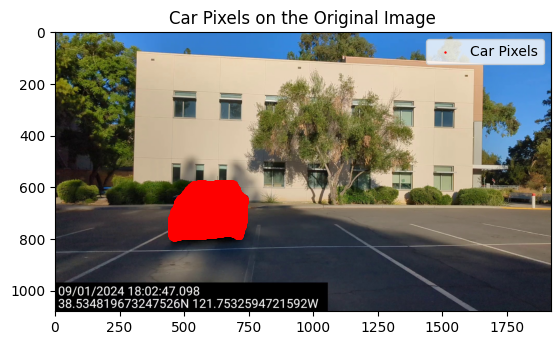

In [18]:
# Load the RGB image
rgb_image = Image.open("assets/demo/TimeVideo_20240901_180247_30feet_frame_0000.jpeg")
rgb_np = np.array(rgb_image)

# Plot the original image
plt.imshow(rgb_np)

# Mark the specific pixel positions on the image
y_coords, x_coords = zip(*pixel_positions)
plt.scatter(x_coords, y_coords, c='red', s=0.5, label="Car Pixels")

# Display the image with marked pixels
plt.title("Car Pixels on the Original Image")
plt.legend()
plt.show()

## Extract points xyz based on the car pixels

In [19]:
print(xyz)
# Debugging: check the shape of the xyz tensor
print(f"before squeeze XYZ shape: {xyz.shape}")  # Should be [1, 3, H, W]
# Remove the batch dimension, currently shape is [1, 3, 1080, 1920]
xyz = xyz.squeeze(0)  # Now shape is [3, 1080, 1920]
print(f"after squeeze XYZ shape: {xyz.shape}")

tensor([[[[-5.7756, -5.7568, -5.7654,  ..., 25.7605, 25.6928, 25.7088],
          [-5.7756, -5.7568, -5.7654,  ..., 25.7605, 25.6928, 25.7088],
          [-5.7761, -5.7573, -5.7656,  ..., 25.8452, 25.7781, 25.7941],
          ...,
          [-1.5823, -1.5771, -1.6181,  ...,  5.8897,  5.9046,  5.9082],
          [-1.5760, -1.5709, -1.6117,  ...,  5.8866,  5.9016,  5.9053],
          [-1.5760, -1.5709, -1.6117,  ...,  5.8866,  5.9016,  5.9053]],

         [[-4.1997, -4.1997, -4.2197,  ..., -3.5811, -3.5694, -3.5694],
          [-4.1810, -4.1810, -4.2009,  ..., -3.5651, -3.5535, -3.5535],
          [-4.1626, -4.1626, -4.1823,  ..., -3.5608, -3.5494, -3.5494],
          ...,
          [ 4.3725,  4.3725,  4.5007,  ...,  3.1115,  3.1174,  3.1174],
          [ 4.3602,  4.3602,  4.4880,  ...,  3.1136,  3.1195,  3.1195],
          [ 4.3653,  4.3653,  4.4933,  ...,  3.1172,  3.1232,  3.1232]],

         [[ 8.8612,  8.8612,  8.9036,  ...,  7.5559,  7.5314,  7.5314],
          [ 8.8612,  8.8612,  

In [20]:
# Extract the 3D coordinates for the corresponding pixel positions
point_cloud = []
for (x, y) in pixel_positions:
    if 0 <= x < xyz.shape[2] and 0 <= y < xyz.shape[1]:
        # Extracting the point cloud at (x, y). Now xyz is [3, H, W]
        point_3d = xyz[:, y, x]  # (3,) extracting the 3D point (X, Y, Z)
        point_cloud.append(point_3d.cpu().numpy())
    else:
        print(f"Pixel ({x}, {y}) is out of bounds.")

# Convert the list of points into a numpy array
point_cloud = np.array(point_cloud)
# Debugging: check the shape of the extracted points
print(f"Extracted point cloud shape: {point_cloud.shape}")  # Should be (N, 3)

Extracted point cloud shape: (57446, 3)


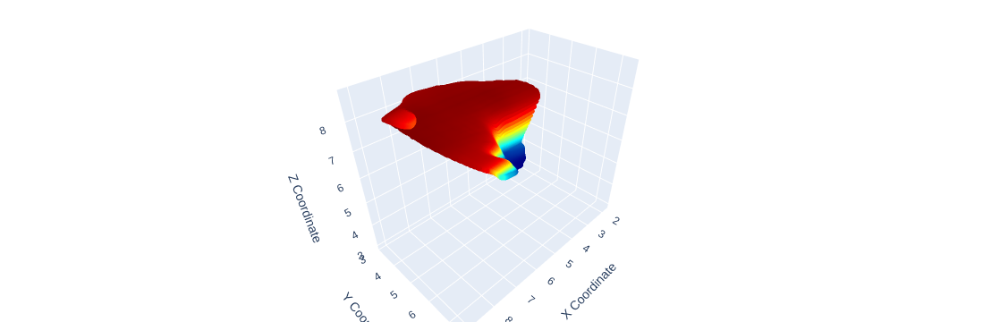

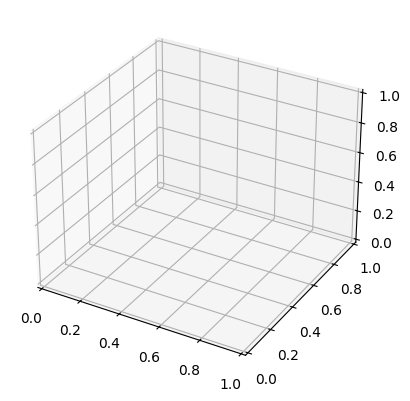

In [25]:
# Visualize the 3D point cloud if the shape is correct
if point_cloud.shape[1] == 3:  # Ensure we have (N, 3) points
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Split the points into X, Y, Z coordinates
    xs = point_cloud[:, 0]
    ys = point_cloud[:, 1]
    zs = point_cloud[:, 2]

    # Create a 3D scatter plot
    fig = go.Figure(data=[go.Scatter3d(
        x=xs,
        y=ys,
        z=zs,
        mode='markers',
        marker=dict(
            size=2,
            color=zs,                # Set color to the Z coordinate values
            colorscale='Jet',         # Color scale
            opacity=0.8
        )
    )])
    
    # Update layout for better visual
    fig.update_layout(scene=dict(
                        xaxis_title='X Coordinate',
                        yaxis_title='Y Coordinate',
                        zaxis_title='Z Coordinate'),
                      margin=dict(r=0, b=0, l=0, t=0))
    
    # Show the plot (this opens an interactive window in Jupyter, or a browser if running standalone)
    fig.show()
else:
    print("Point cloud does not have 3D points.")

## Extract points based on edge pixels 


In [32]:
# Extract depth and point cloud
depth = predictions["depth"].squeeze().cpu().numpy()  # Remove batch dimension and move to CPU
xyz = predictions["points"].squeeze(0).cpu().numpy()  # Remove batch dimension and move to CPU


In [33]:
print("Depth shape:", depth.shape)


Depth shape: (1080, 1920)


In [34]:
def find_key_pixels(pixel_positions, xyz, depth):
    # Initialize variables for key positions
    most_left = most_right = top = bottom = closest = furthest = None
    min_x = min_y = min_z = float('inf')
    max_x = max_y = max_z = float('-inf')

    for (x, y) in pixel_positions:
        # Ensure that the pixel is within bounds
        if 0 <= x < xyz.shape[2] and 0 <= y < xyz.shape[1]:
            point_3d = xyz[:, y, x]  # Extract the 3D point at (x, y)
            depth_value = depth[y, x]

            # Update the key positions based on conditions
            if x < min_x:
                min_x = x
                most_left = (x, y, point_3d)
            if x > max_x:
                max_x = x
                most_right = (x, y, point_3d)
            if y < min_y:
                min_y = y
                top = (x, y, point_3d)
            if y > max_y:
                max_y = y
                bottom = (x, y, point_3d)
            if depth_value < min_z:
                min_z = depth_value
                closest = (x, y, point_3d, depth_value)
            if depth_value > max_z:
                max_z = depth_value
                furthest = (x, y, point_3d, depth_value)

    return most_left, most_right, top, bottom, closest, furthest

In [35]:
# Find the key pixels
most_left, most_right, top, bottom, closest, furthest = find_key_pixels(pixel_positions, xyz, depth)

# Display the key pixels information
print("Most left pixel:", most_left)
print("Most right pixel:", most_right)
print("Top pixel:", top)
print("Bottom pixel:", bottom)
print("Closest pixel:", closest)
print("Furthest pixel:", furthest)

Most left pixel: (575, 660, array([2.0096793, 3.265604 , 3.5485942], dtype=float32))
Most right pixel: (802, 456, array([7.9971952, 3.736743 , 7.63659  ], dtype=float32))
Top pixel: (726, 441, array([7.586901, 3.917805, 8.56099 ], dtype=float32))
Bottom pixel: (649, 744, array([2.1477308, 3.2603586, 2.9701848], dtype=float32))
Closest pixel: (643, 743, array([2.109936 , 3.2540197, 2.970126 ], dtype=float32), 2.970126)
Furthest pixel: (794, 551, array([9.056529 , 6.0653877, 8.790418 ], dtype=float32), 8.790418)


Here’s how to understand the printout for each pixel:

1. **Most left pixel: (575, 660, array([2.0096793, 3.265604 , 3.5485942], dtype=float32))**
   - **(575, 660)**: The pixel coordinates in the 2D image where this is the most left pixel (smallest x-coordinate).
   - **array([2.0096793, 3.265604 , 3.5485942], dtype=float32)**: This is the 3D point in the camera's coordinate system corresponding to that pixel, where:
     - `2.0096793` is the X-coordinate,
     - `3.265604` is the Y-coordinate,
     - `3.5485942` is the Z-coordinate (depth).
   
2. **Most right pixel: (802, 456, array([7.9971952, 3.736743 , 7.63659  ], dtype=float32))**
   - **(802, 456)**: The pixel coordinates in the 2D image where this is the most right pixel (largest x-coordinate).
   - **array([7.9971952, 3.736743 , 7.63659  ], dtype=float32)**: The 3D point corresponding to this pixel.
   
3. **Top pixel: (726, 441, array([7.586901, 3.917805, 8.56099 ], dtype=float32))**
   - **(726, 441)**: The pixel coordinates for the topmost pixel (smallest y-coordinate).
   - **array([7.586901, 3.917805, 8.56099 ], dtype=float32)**: The 3D point of this top pixel.
   
4. **Bottom pixel: (649, 744, array([2.1477308, 3.2603586, 2.9701848], dtype=float32))**
   - **(649, 744)**: The pixel coordinates for the bottommost pixel (largest y-coordinate).
   - **array([2.1477308, 3.2603586, 2.9701848], dtype=float32)**: The 3D point of the bottom pixel.
   
5. **Closest pixel: (643, 743, array([2.109936 , 3.2540197, 2.970126 ], dtype=float32), 2.970126)**
   - **(643, 743)**: The pixel coordinates for the closest pixel to the camera (smallest Z-coordinate).
   - **array([2.109936 , 3.2540197, 2.970126 ], dtype=float32)**: The 3D point of the closest pixel.
   - **2.970126**: The depth (Z-coordinate) of the closest pixel.

6. **Furthest pixel: (794, 551, array([9.056529 , 6.0653877, 8.790418 ], dtype=float32), 8.790418)**
   - **(794, 551)**: The pixel coordinates for the furthest pixel from the camera (largest Z-coordinate).
   - **array([9.056529 , 6.0653877, 8.790418 ], dtype=float32)**: The 3D point of the furthest pixel.
   - **8.790418**: The depth (Z-coordinate) of the furthest pixel.

### Key Points:
- **Pixel Coordinates (u, v)**: These refer to the position of the pixel on the 2D image (width `u`, height `v`).
- **3D Point (X, Y, Z)**: This is the position of the pixel in 3D space, where `X` and `Y` are the spatial coordinates in the camera's coordinate system, and `Z` represents the depth of the pixel from the camera.
- **Depth**: The distance between the camera and the object at that pixel (Z-coordinate).

This allows you to understand the spatial distribution of the object (car) in both 2D image space and 3D camera space.